# Выбор локации для скважины

Допустим, вы работаете в добывающей компании «ГлавРосГосНефть». Нужно решить, где бурить новую скважину.

Вам предоставлены пробы нефти в трёх регионах: в каждом 10 000 месторождений, где измерили качество нефти и объём её запасов. Постройте модель машинного обучения, которая поможет определить регион, где добыча принесёт наибольшую прибыль. Проанализируйте возможную прибыль и риски техникой *Bootstrap.*

Шаги для выбора локации:

- В избранном регионе ищут месторождения, для каждого определяют значения признаков;
- Строят модель и оценивают объём запасов;
- Выбирают месторождения с самым высокими оценками значений. Количество месторождений зависит от бюджета компании и стоимости разработки одной скважины;
- Прибыль равна суммарной прибыли отобранных месторождений.

Дополнительные условия:  
Для обучения модели подходит только линейная регрессия (остальные — недостаточно предсказуемые).  
При разведке региона исследуют 500 точек, из которых с помощью машинного обучения выбирают 200 лучших для разработки.  
Бюджет на разработку скважин в регионе — 10 млрд рублей.  
При нынешних ценах один баррель сырья приносит 450 рублей дохода. Доход с каждой единицы продукта составляет 450 тыс. рублей, поскольку объём указан в тысячах баррелей.  
После оценки рисков нужно оставить лишь те регионы, в которых вероятность убытков меньше 2.5%. Среди них выбирают регион с наибольшей средней прибылью.  

**План работы:**

1. Загрузить и подготовить данные.
2. Обучить и проверить модель для каждого региона:    
    2.1. Разбить данные на обучающую и валидационную выборки в соотношении 75:25.  
    2.2. Обучить модель и сделать предсказания на валидационной выборке.  
    2.3. Сохранить предсказания и правильные ответы на валидационной выборке.  
    2.4. Напечатать на экране средний запас предсказанного сырья и RMSE модели.  
    2.5. Проанализировать результаты.  
3. Подготовка к расчёту прибыли:  
    3.1. Все ключевые значения для расчётов сохранить в отдельных переменных.  
    3.2. Рассчитать достаточный объём сырья для безубыточной разработки новой скважины. Сравнить полученный объём сырья со средним запасом в каждом регионе.  
    3.3. Написвть выводы по этапу подготовки расчёта прибыли.  
4. Функция для расчёта прибыли по выбранным скважинам и предсказаниям модели:  
    4.1. Выберать скважины с максимальными значениями предсказаний.  
    4.2. Просуммировать целевое значение объёма сырья, соответствующее этим предсказаниям.  
    4.3. Рассчитать прибыль для полученного объёма сырья.  
5. Риски и прибыль для каждого региона:  
    5.1. Применить технику Bootstrap с 1000 выборок, чтобы найти распределение прибыли.  
    5.2. Найти среднюю прибыль, 95%-й доверительный интервал и риск убытков.  
    5.3. Предложить регион для разработки скважин и обосновать выбор.  

## 1. Загрузка и подготовка данных

In [1]:
# ипморт библиотек
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from numpy.random import RandomState
state = RandomState(0)
from tqdm import tqdm

In [2]:
# загрузка и сохранение данных
data0 = pd.read_csv(r'C:\\dataset_praktikum/geo_data_0.csv')
data1 = pd.read_csv(r'C:\\dataset_praktikum/geo_data_1.csv')
data2 = pd.read_csv(r'C:\\dataset_praktikum/geo_data_2.csv')

Опишем данные:  
id — уникальный идентификатор скважины;  
f0, f1, f2 — три признака точек (неважно, что они означают, но сами признаки значимы);  
product — объём запасов в скважине (тыс. баррелей).  

Напишем функцию для exploratory data analysis.

In [3]:
def exploration(data):
    '''
    функция EDA
    параметр - исследуемый dataframe
    return - общая информация о dataframe
    '''
    print('\033[1m Основная информация \033[0m')
    print()
    data.info()
    print(100*'*')
    print()
    print('\033[1m Первые пять строк \033[0m')
    display(data.head())
    print(100*'*')
    print()
    print('\033[1m Проверка на дубликаты \033[0m')
    print('Количество дубликатов = ', data0.duplicated().sum())
    print(100*'*')
    print()
    print('\033[1m Основная статистическая информация \033[0m')
    display(data.describe().T)
    print(100*'*')
    print()
    print('\033[1m Распределение данных (гистограммы) \033[0m')
    data.hist(bins=50, figsize=(20,15), edgecolor='#76d2db', linewidth=2)
    plt.show()
    print(100*'*')
    print()
    print('\033[1m Корреляция данных \033[0m')
    plt.figure()
    sns.heatmap(data.corr(), annot = True, fmt = '0.3f', cmap="YlGnBu")
    plt.show()

**Рассмотрим data0 (регион №1)**

 Основная информация 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB
****************************************************************************************************

 Первые пять строк 


,id,f0,f1,f2,product
0,txEyH,0.705745,-0.497823,1.221170,105.280062
1,2acmU,1.334711,-0.340164,4.365080,73.037750
2,409Wp,1.022732,0.151990,1.419926,85.265647
3,iJLyR,-0.032172,0.139033,2.978566,168.620776
4,Xdl7t,1.988431,0.155413,4.751769,154.036647


****************************************************************************************************

 Проверка на дубликаты 
Количество дубликатов =  0
****************************************************************************************************

 Основная статистическая информация 


,count,mean,std,min,25%,50%,75%,max
f0,100000.0,0.500419,0.871832,-1.408605,-0.072580,0.502360,1.073581,2.362331
f1,100000.0,0.250143,0.504433,-0.848218,-0.200881,0.250252,0.700646,1.343769
f2,100000.0,2.502647,3.248248,-12.088328,0.287748,2.515969,4.715088,16.003790
product,100000.0,92.500000,44.288691,0.000000,56.497507,91.849972,128.564089,185.364347


****************************************************************************************************

 Распределение данных (гистограммы) 


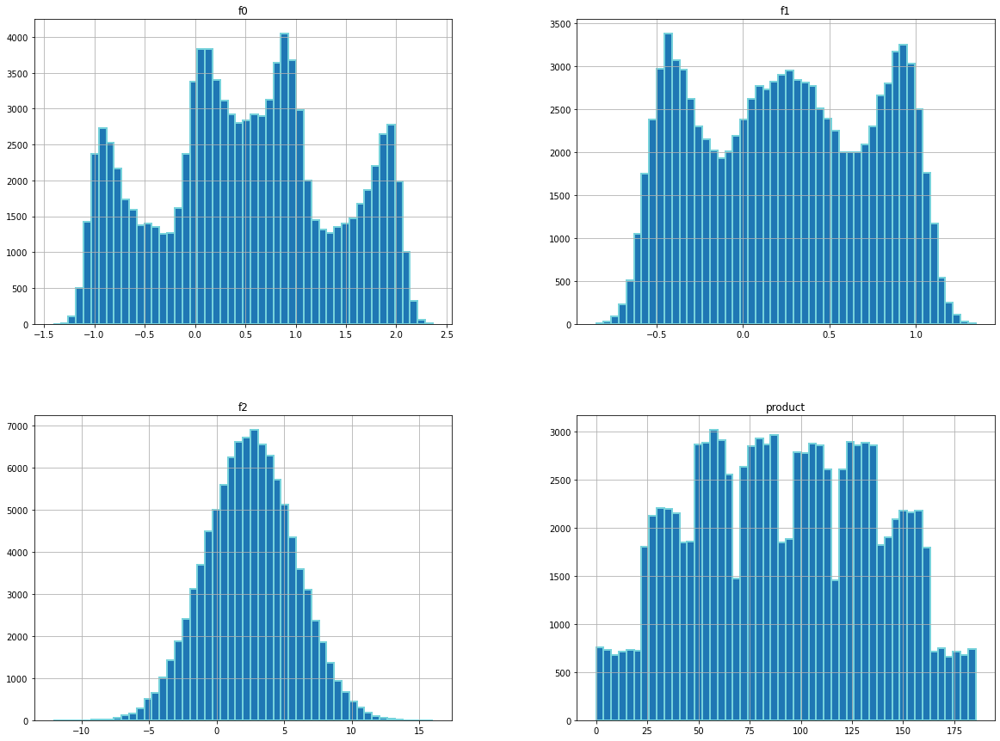

****************************************************************************************************

 Корреляция данных 


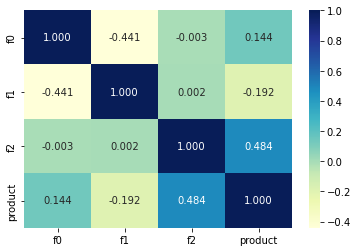

In [4]:
exploration(data0)

<font color="blue">data0  
Пропущенных значений, дубликатов нет. Аномальных значений (выбросов) нет. Можно отметить, что признак f2 сильнее коррелирует с product (коэффициент корреляции = 0.484), чем f0 (0.144) и f1 (-0.192). Распределение признака f2 похоже на нормальное, f0 и f1 не распределены нормально (есть несколько мод). </font>

**Рассмотрим data1 (регион №2)**

 Основная информация 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB
****************************************************************************************************

 Первые пять строк 


,id,f0,f1,f2,product
0,kBEdx,-15.001348,-8.276000,-0.005876,3.179103
1,62mP7,14.272088,-3.475083,0.999183,26.953261
2,vyE1P,6.263187,-5.948386,5.001160,134.766305
3,KcrkZ,-13.081196,-11.506057,4.999415,137.945408
4,AHL4O,12.702195,-8.147433,5.004363,134.766305


****************************************************************************************************

 Проверка на дубликаты 
Количество дубликатов =  0
****************************************************************************************************

 Основная статистическая информация 


,count,mean,std,min,25%,50%,75%,max
f0,100000.0,1.141296,8.965932,-31.609576,-6.298551,1.153055,8.621015,29.421755
f1,100000.0,-4.796579,5.119872,-26.358598,-8.267985,-4.813172,-1.332816,18.734063
f2,100000.0,2.494541,1.703572,-0.018144,1.000021,2.011479,3.999904,5.019721
product,100000.0,68.825000,45.944423,0.000000,26.953261,57.085625,107.813044,137.945408


****************************************************************************************************

 Распределение данных (гистограммы) 


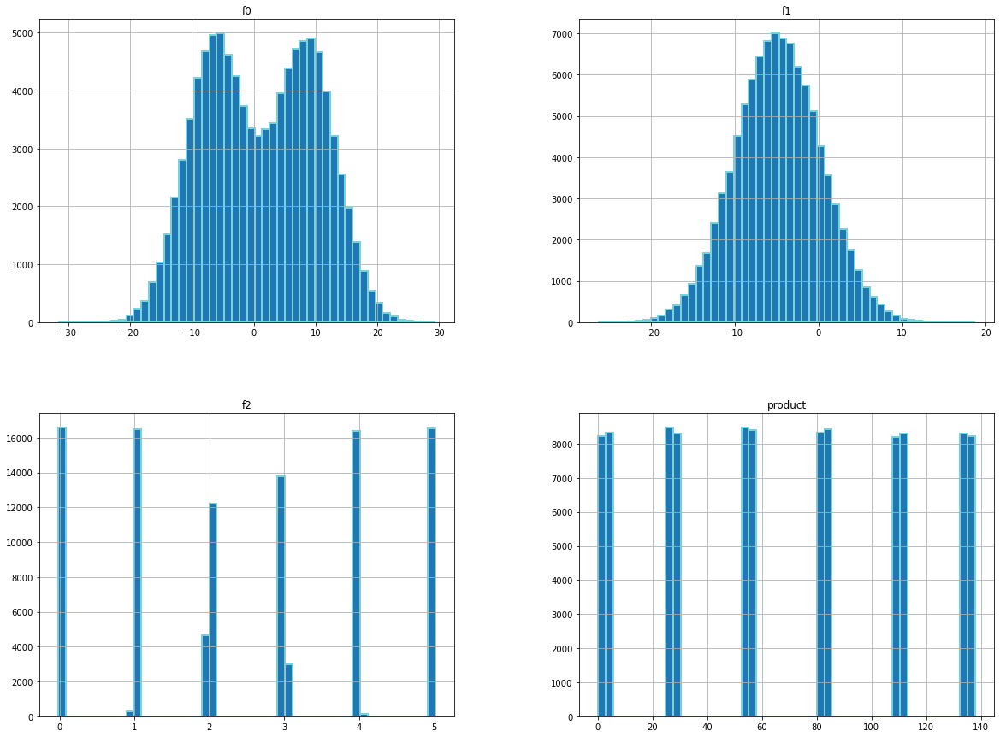

****************************************************************************************************

 Корреляция данных 


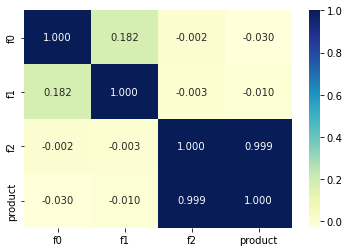

In [5]:
exploration(data1)

In [6]:
round(data1.f2,2).value_counts() # количество уникальных значений столбца

 3.00    11481
 2.00    11452
 1.00    11451
 4.00    11365
-0.00    11294
 5.00    11256
 2.01     2703
 0.99     2657
 1.99     2652
 2.99     2646
 0.01     2625
 5.01     2620
 1.01     2617
 4.99     2617
 4.01     2611
-0.01     2606
 3.01     2575
 3.99     2495
 2.02       30
 2.98       27
 1.98       25
 1.02       25
-0.02       24
 0.98       24
 0.02       23
 4.98       23
 3.02       22
 5.02       21
 3.98       17
 4.02       16
Name: f2, dtype: int64

<font color="blue">data1   
Пропущенных значений, дубликатов нет. Аномальных значений (выбросов) нет.  
Признак f2 мультикоррелиарен с product (коэффициент корреляции = 0.999). Распределение признака f1 похоже на нормальное, f0 и f2 не распределены нормально (есть несколько мод). f0 c product не коррелирует (коэффициент корреляции = -0,03), у f1 слабая корреляция с product (0.182). Объём запасов в скважине укрупненно можно разделить на несколько ценовых групп.</font>

**Рассмотрим data2 (регион №3)**

 Основная информация 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 3.8+ MB
****************************************************************************************************

 Первые пять строк 


,id,f0,f1,f2,product
0,fwXo0,-1.146987,0.963328,-0.828965,27.758673
1,WJtFt,0.262778,0.269839,-2.530187,56.069697
2,ovLUW,0.194587,0.289035,-5.586433,62.871910
3,q6cA6,2.236060,-0.553760,0.930038,114.572842
4,WPMUX,-0.515993,1.716266,5.899011,149.600746


****************************************************************************************************

 Проверка на дубликаты 
Количество дубликатов =  0
****************************************************************************************************

 Основная статистическая информация 


,count,mean,std,min,25%,50%,75%,max
f0,100000.0,0.002023,1.732045,-8.760004,-1.162288,0.009424,1.158535,7.238262
f1,100000.0,-0.002081,1.730417,-7.084020,-1.174820,-0.009482,1.163678,7.844801
f2,100000.0,2.495128,3.473445,-11.970335,0.130359,2.484236,4.858794,16.739402
product,100000.0,95.000000,44.749921,0.000000,59.450441,94.925613,130.595027,190.029838


****************************************************************************************************

 Распределение данных (гистограммы) 


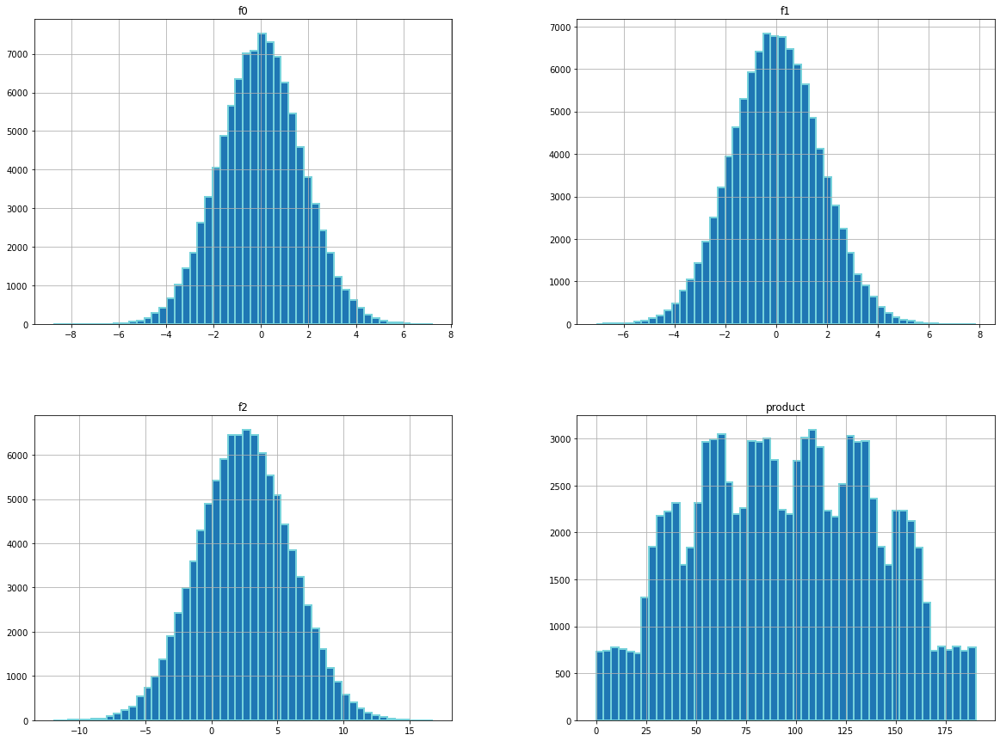

****************************************************************************************************

 Корреляция данных 


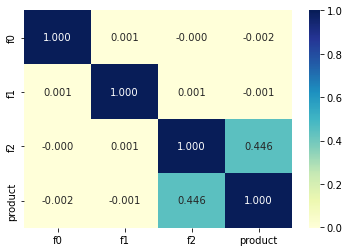

In [7]:
exploration(data2)

<font color="blue">data2   
Пропущенных значений, дубликатов нет. Аномальных значений (выбросов) нет. Можно отметить, что признак f2 коррелирует с product (коэффициент корреляции = 0.446), а у f0 и f1 корреляция с product отсутствует. Распределения признаков f0, f1 и f2 похожи на нормальные.</font>

**Сравним объём запасов нефти по каждому региону.**

In [8]:
fig = go.Figure()
fig.add_trace(go.Box(y=data0['product'], name="Регион №1"))
fig.add_trace(go.Box(y=data1['product'], name="Регион №2"))
fig.add_trace(go.Box(y=data2['product'], name="Регион №3"))
#fig.update_layout(title_text = "Распределение запасов нефти в скважинах по регионам")
fig.update_layout(title=dict(text='<b>Распределение запасов нефти в скважинах по регионам</b>',font=dict(
            family="Arial",
            size=18,
            color='#344243'), x=0.15))
fig.show()

In [9]:
df = pd.DataFrame()
for n, name in zip([data0,data1,data2],['Регион №1', 'Регион №2', 'Регион №3']):
    mean_ = round(n['product'].mean())
    median_ = round(n['product'].median())
    sum_ = round(n['product'].sum())
    df0 = pd.DataFrame({'mean': mean_, 'meadian': median_, 'sum': sum_}, index = [name])
    df = pd.concat([df,df0])
df.sort_values(['mean'], ascending=False).style.bar(subset=['mean'], color='#adc6e9')

,mean,meadian,sum
Регион №3,95,95,9500000
Регион №1,92,92,9250000
Регион №2,69,57,6882500


<font color="blue">   
В среднем в регионе №3  и регионе №1 запасы нефти примерно равны (93-95). В регионе №2 нефти в среднем меньше на 27 % (69).</font>

### Вывод по шагу 1 (Загрузка и подготовка данных)

<font color='green'>Данные представлены в хорошем виде. Пропущенных значений, дубликатов нет. Аномальные значения (выбросы) отсутствуют.  
data0  
Можно отметить, что признак f2 коррелирует с product (коэффициент корреляции = 0.446), а у f0 и f1 корреляция с product отсутствует. Распределения признаков f0, f1 и f2 похожи на нормальные.  
data1  
Признак f2 мультикоррелиарен с product (коэффициент корреляции = 0.999). Распределение признака f1 похоже на нормальное, f0 и f2 не распределены нормально (есть несколько мод). f0 c product не коррелирует (коэффициент корреляции = -0,03), у f1 слабая корреляция с product (0.182). Объём запасов в скважине укрупненно можно разделить на несколько ценовых групп.   
data2  
Можно отметить, что признак f2 коррелирует с product (коэффициент корреляции = 0.446), а у f0 и f1 корреляция с product отсутствует. Распределения признаков f0, f1 и f2 похожи на нормальные.  

В среднем в регионе №3  и регионе №1 запасы нефти примерно равны (93-95). В регионе №2 нефти в среднем меньше на 27 % (69).
</font>

## 2. Обучение и проверка модели

Напишем функцию для обучения модели ленейной регрессии и подсчета метрик на валидационной выборке.
- MSE — средняя квадратичная ошибка  
- RMSE — квадратный корень из средней квадратичной ошибки  
- R2 — коэффициент детерминации. Метрика вычисляет долю средней квадратичной ошибки модели от MSE среднего, а затем вычитает эту величину из единицы. Чем ближе показатель к 1, тем лучше качество модели  
- mean — средний запас предсказанного сырья  
- mae — среднее абсолютное отклонение

In [10]:
def metric(dataset, name_rigion):
    """
    функция для обучения линейной регрессии и подсчета метрик на валидационной выборке
    параметры - датасет с данными, имя датасета
    return - DataFrame с метриками, target_valid, predicted_valid
    """
    target = dataset['product'] # извлечем признаки
    features = dataset.drop(['id','product'], axis=1) # извлечем зависимую переменную
    
    # отделим 25%  данных для валидационной выборки
    features_train, features_valid, target_train, target_valid = train_test_split(
    features, target, test_size=0.25, random_state=0) 
    
    model = LinearRegression()
    model.fit(features_train, target_train) # обучим модель на тренировочной выборке
    predicted_valid = model.predict(features_valid) # получим предсказания модели на валидационной выборке
    
    mse_ = mean_squared_error(target_valid, predicted_valid)
    rmse_ = mse_**0.5
    mae_ = mean_absolute_error(target_valid, predicted_valid)
    mean_valid = predicted_valid.mean()
    r2_ = r2_score(target_valid, predicted_valid)
    
    metric_data = pd.DataFrame({'rmse': rmse_,
                            'mean_valid': mean_valid,
                              'mse': mse_,  
                             'mae': mae_,
                           'r2': r2_},
                               index=[name_rigion])
    return metric_data, target_valid, predicted_valid

Обучим модель, получим предсазания запасов нефти и посчитаем метрики по каждому региону. Также для дальнейшего анализа сформируем таблицу с фактическими запасами нефти и предсказанными.

In [11]:
metric_data = pd.DataFrame()
target_predict = pd.DataFrame()
for n, name in zip([data0,data1,data2],['region1', 'region2', 'region3']):
    metric_df, target_valid, predicted_valid = metric(n, name)
    metric_data = pd.concat([metric_data, metric_df])
    
    target_predict_data = pd.DataFrame({name+'_predict':predicted_valid, name+'_target':list(target_valid)})
    target_predict = pd.concat([target_predict, target_predict_data], axis=1)

In [12]:
metric_data

,rmse,mean_valid,mse,mae,r2
region1,37.481009,92.271449,1404.826033,30.770329,0.280926
region2,0.887257,69.151624,0.787226,0.715548,0.999627
region3,40.312907,94.707531,1625.130460,33.021531,0.194384


In [13]:
target_predict.head()

,region1_predict,region1_target,region2_predict,region2_target,region3_predict,region3_target
0,95.303891,49.723143,134.451381,134.766305,103.879759,129.102262
1,95.098407,10.583795,137.031555,137.945408,59.948159,61.285744
2,106.702273,139.110613,2.835624,3.179103,108.629782,65.026246
3,96.740059,85.109875,111.274297,110.992147,99.219377,62.334048
4,97.703381,39.726827,138.109072,137.945408,90.361944,150.002134


### Вывод по шагу 2 (Обучение и проверка модели)

<font color="green"> Модель линейной регрессии лучше всего предсказывает запасы нефти в регионе №2. Метрики на порядок лучше чем в других регионах, но это связано с мультикоррелиарностью одного признака с целевой переменной в регионе №2 (возможно ошибка в данных, необходимо уточнить у заказчика иформацию по признакам).  
Предсказания среднего запаса нефти на валидационной выборке почти не отличаются от фактических средних запасов нефти в каждом из регионов. </font>

## 3. Подготовка к расчёту прибыли

Ключевые значения для расчётов сохраним в отдельных переменных.

In [14]:
BUDGET = 10000000000   # бюджет на один регион  (в рублях)
TOTAL_POINT = 500 # к-во исследуемых точек
BEST_POINT = 200  # к-во точек для расчёта прибыли
PROFIT = 450000   # доход с одной единицы продукта (в рублях)
# максимальный уровень убытков 2.5%

Рассчитаем достаточный объём сырья для безубыточной разработки новой скважины.

In [15]:
min_product_mean  = round(BUDGET/BEST_POINT/PROFIT)
min_product_mean

111

### Вывод по шагу 3 (Подготовка к расчёту прибыли)

<font color="green"> Для безубыточной работы в регионе необходимо, чтобы в среднем по региону на одну  скважину было как минимум 111 единиц продукта. Средние предсказания объема нефти во всех регионах меньше этого объема. </font>

## 4. Расчёт прибыли и рисков 

Напишем функцию для расчета прибыли.

In [16]:
def profits(target, predict, count):
    """
    Функция принимает 3 аргумента:
    - target (истинные значения целевого признака)
    - predict (предсказания)
    - count (количество скважин)
    return - прибыль в млн. руб.
    """
    probs_sorted = predict.sort_values(ascending=False)
    return (PROFIT * target[probs_sorted.index][:count].sum() - BUDGET)/1000000

Применим технику Bootstrap с 1000 выборок и найдем распределение прибыли. Найдем среднюю прибыль, 95%-й доверительный интервал и риск убытков.

In [17]:
revenue_risk = pd.DataFrame()
for name,t,p in tqdm(zip(['region1', 'region2', 'region3'],
               ['region1_target', 'region2_target', 'region3_target'],
              ['region1_predict', 'region2_predict', 'region3_predict'])):
    revenues = []
    for i in range(1000):
        target_subsample = target_predict[t].sample(n=TOTAL_POINT, replace=True, random_state=state)
        probs_subsample = target_predict[p][target_subsample.index]
        revenue = profits(target_subsample, probs_subsample, BEST_POINT)
        revenues.append(revenue)
    revenues = pd.Series(revenues)
    mean_revenue = round(revenues.mean())
    interval_95 = round(revenues.quantile(0.025)), round(revenues.quantile(0.975))
    risk = round((revenues < 0).mean()* 100,1)
    revenue_risk_df = pd.DataFrame({'mean_revenue': mean_revenue,
                                    'interval_95': str(interval_95),
                                    'risk,%': risk},
                                   index = [name])
    revenue_risk = pd.concat([revenue_risk, revenue_risk_df])

3it [00:12,  4.10s/it]


In [18]:
revenue_risk.style.highlight_max(subset='mean_revenue', color = '#adc6e9')

,mean_revenue,interval_95,"risk,%"
region1,471,"(-44, 997)",3.500000
region2,528,"(125, 925)",0.400000
region3,412,"(-115, 970)",6.000000


### Вывод по шагу 4 (Расчёт прибыли и рисков)

<font color="green"> Самый высокий показатель средней прибыли во втором регионе, также только у региона №2 риск убытка менее 2,5%.</font>

## Общий вывод

Данные представлены в хорошем виде. Пропущенных значений, дубликатов нет. Аномальные значения (выбросы) отсутствуют.  
region1
Можно отметить, что признак f2 коррелирует с product (коэффициент корреляции = 0.446), а у f0 и f1 корреляция с product отсутствует. Распределения признаков f0, f1 и f2 похожи на нормальные.  
region2  
Признак f2 мультикоррелиарен с product (коэффициент корреляции = 0.999). Распределение признака f1 похоже на нормальное, f0 и f2 не распределены нормально (есть несколько мод). f0 c product не коррелирует (коэффициент корреляции = -0,03), у f1 слабая корреляция с product (0.182). Объём запасов в скважине укрупненно можно разделить на несколько ценовых групп.  
region3  
Можно отметить, что признак f2 коррелирует с product (коэффициент корреляции = 0.446), а у f0 и f1 корреляция с product отсутствует. Распределения признаков f0, f1 и f2 похожи на нормальные.  

В среднем в регионе №3 и регионе №1 запасы нефти примерно равны (93-95). В регионе №2 нефти в среднем меньше на 27 % (69).  

Модель линейной регрессии лучше всего предсказывает запасы нефти в регионе №2. Метрики на порядок лучше чем в других регионах, но это связано с мультикоррелиарностью одного признака с целевой переменной в регионе №2 (возможно ошибка в данных, необходимо уточнить у заказчика иформацию по признакам).  
Предсказания среднего запаса нефти на валидационной выборке почти не отличаются от фактических средних запасов нефти в каждом из регионов.  

Для безубыточной работы в регионе необходимо, чтобы в среднем по региону на одну скважину было как минимум 111 единиц продукта. Средние предсказания объема нефти во всех регионах меньше этого объема.  

Самый высокий показатель средней прибыли во втором регионе, также только у региона №2 риск убытка менее 2,5%.

**На основании проведенного анализа наиболее перспективным райном для разработки скважин можно считать регион №2. Несмотря на небольшие запасы нефти, но благодаря хорошей предсказательной модели во 2 регионе наибольшая средняя прибыль и наименьший риск безубытка.**